# DALL-E

In [27]:
import openai
from dotenv import dotenv_values
import os
import requests
from IPython.display import Image
import base64

In [28]:
config = dotenv_values(".env")

In [29]:
openai.api_key = config["OPENAI_API_KEY"]

In [30]:
image_directory_name = "images"
image_directory = os.path.join(os.curdir, image_directory_name)

if not os.path.isdir(image_directory):
    os.mkdir(image_directory)

In [13]:
res = openai.Image.create(
    prompt="a mermaid swiming in a coral city, digital art",
    size="1024x1024",
    n=1
)

image_url = res["data"][0]["url"]

In [14]:
image_filepath = os.path.join(image_directory, "mermaind.png")

In [15]:
image_content = requests.get(image_url).content

In [17]:
with open(image_filepath, "wb") as image_file:
    image_file.write(image_content)

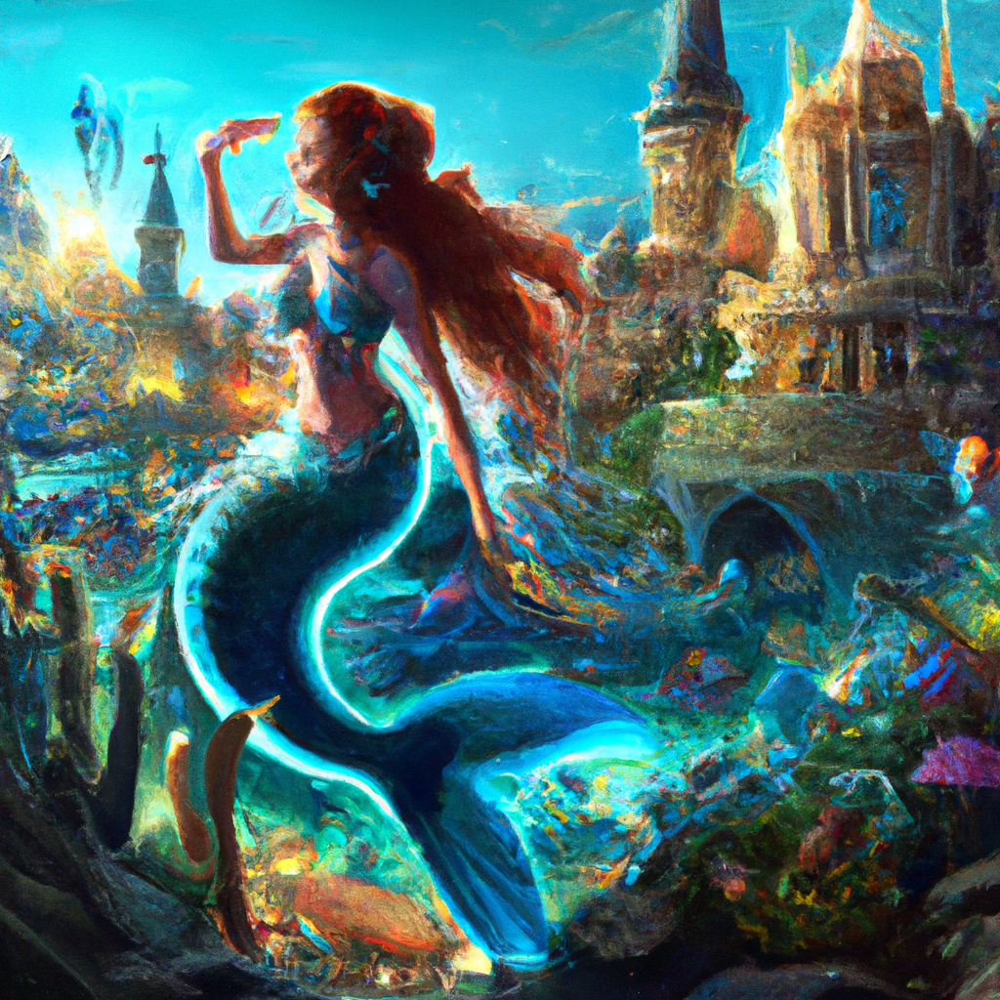

In [19]:
Image(filename=image_filepath)

'https://oaidalleapiprodscus.blob.core.windows.net/private/org-p2P9b7sAD0VJ0Ep6lfkeYQRl/user-gthujzrnG9cpZMXelvze51i0/img-ZG2lzj7g30Ju3K5asCLIiobY.png?st=2023-05-22T23%3A49%3A34Z&se=2023-05-23T01%3A49%3A34Z&sp=r&sv=2021-08-06&sr=b&rscd=inline&rsct=image/png&skoid=6aaadede-4fb3-4698-a8f6-684d7786b067&sktid=a48cca56-e6da-484e-a814-9c849652bcb3&skt=2023-05-22T21%3A21%3A16Z&ske=2023-05-23T21%3A21%3A16Z&sks=b&skv=2021-08-06&sig=Jjk1/UekUIFJa2NVyb8bsP6RHk/sydTBqFNL4a3oK3E%3D'

In [10]:
def save_image(url, image_name):
    image_directory_name = "images"
    image_directory = os.path.join(os.curdir, image_directory_name)

    if not os.path.isdir(image_directory):
        os.mkdir(image_directory)
        
    image_filepath = os.path.join(image_directory, image_name)
    
    image_content = requests.get(url).content
    
    with open(image_filepath, "wb") as image_file:
        image_file.write(image_content)

In [11]:
def get_image(prompt, image_name):
    res = openai.Image.create(
        prompt=prompt,
        size="512x512",
        n=1
    )
    image_url = res["data"][0]["url"]
    save_image(image_url, image_name)

In [12]:
get_image("surfing on Pluto", "surf_pluto.png")

## Alternative approach to saving images

In [31]:
def get_and_save_image(prompt, image_name):
    res = openai.Image.create(
        prompt=prompt,
        size="512x512",
        n=1,
        response_format="b64_json",
    )
    image_filepath = res["data"][0]["b64_json"]
    
    image_directory_name = "images"
    image_directory = os.path.join(os.curdir, image_directory_name)
    
    if not os.path.isdir(image_directory):
        os.mkdir(image_directory)
        
    image_filepath = os.path.join(image_directory, image_name)
    
    decoded_img = base64.b64decode(image_data)
    
    with open(image_filepath, "wb") as f:
        f.write(decoded_img)

In [37]:
get_and_save_image("a friendly cactus sitting in a pot, digital art", "cactus.png")

APIError: The server had an error while processing your request. Sorry about that! You can retry your request, or contact us through our help center at help.openai.com if the error persists. (Please include the request ID e8669213b342c39cbb7a06ea3be37a21 in your message.) {
  "error": {
    "code": null,
    "message": "The server had an error while processing your request. Sorry about that! You can retry your request, or contact us through our help center at help.openai.com if the error persists. (Please include the request ID e8669213b342c39cbb7a06ea3be37a21 in your message.)",
    "param": null,
    "type": "server_error"
  }
}
 500 {'error': {'code': None, 'message': 'The server had an error while processing your request. Sorry about that! You can retry your request, or contact us through our help center at help.openai.com if the error persists. (Please include the request ID e8669213b342c39cbb7a06ea3be37a21 in your message.)', 'param': None, 'type': 'server_error'}} {'Date': 'Tue, 23 May 2023 12:46:13 GMT', 'Content-Type': 'application/json', 'Content-Length': '366', 'Connection': 'keep-alive', 'access-control-allow-origin': '*', 'openai-version': '2020-10-01', 'x-request-id': 'e8669213b342c39cbb7a06ea3be37a21', 'openai-processing-ms': '90', 'strict-transport-security': 'max-age=15724800; includeSubDomains', 'CF-Cache-Status': 'DYNAMIC', 'Server': 'cloudflare', 'CF-RAY': '7cbd6684495e8280-IAD', 'alt-svc': 'h3=":443"; ma=86400, h3-29=":443"; ma=86400'}

## Image Variation

In [36]:
res = openai.Image.create_variation(
    image=open("./images/mermaind.png", "rb"),
    n=6,
)

APIError: The server had an error while processing your request. Sorry about that! You can retry your request, or contact us through our help center at help.openai.com if the error persists. (Please include the request ID 31f6906630d09d2ba728f5a4bb0590e5 in your message.) {
  "error": {
    "code": null,
    "message": "The server had an error while processing your request. Sorry about that! You can retry your request, or contact us through our help center at help.openai.com if the error persists. (Please include the request ID 31f6906630d09d2ba728f5a4bb0590e5 in your message.)",
    "param": null,
    "type": "server_error"
  }
}
 500 {'error': {'code': None, 'message': 'The server had an error while processing your request. Sorry about that! You can retry your request, or contact us through our help center at help.openai.com if the error persists. (Please include the request ID 31f6906630d09d2ba728f5a4bb0590e5 in your message.)', 'param': None, 'type': 'server_error'}} {'Date': 'Tue, 23 May 2023 12:45:58 GMT', 'Content-Type': 'application/json', 'Content-Length': '366', 'Connection': 'keep-alive', 'access-control-allow-origin': '*', 'openai-version': '2020-10-01', 'x-request-id': '31f6906630d09d2ba728f5a4bb0590e5', 'openai-processing-ms': '79', 'strict-transport-security': 'max-age=15724800; includeSubDomains', 'CF-Cache-Status': 'DYNAMIC', 'Server': 'cloudflare', 'CF-RAY': '7cbd661abb5b8280-IAD', 'alt-svc': 'h3=":443"; ma=86400, h3-29=":443"; ma=86400'}

In [ ]:
for idx, img in enumerate(rese["data"]):
    save_image(img["url"], f"mermaid-{idx}.png")

## Image Edits

In [38]:
wave_image = open("./images/great_wave.png", "rb").read()

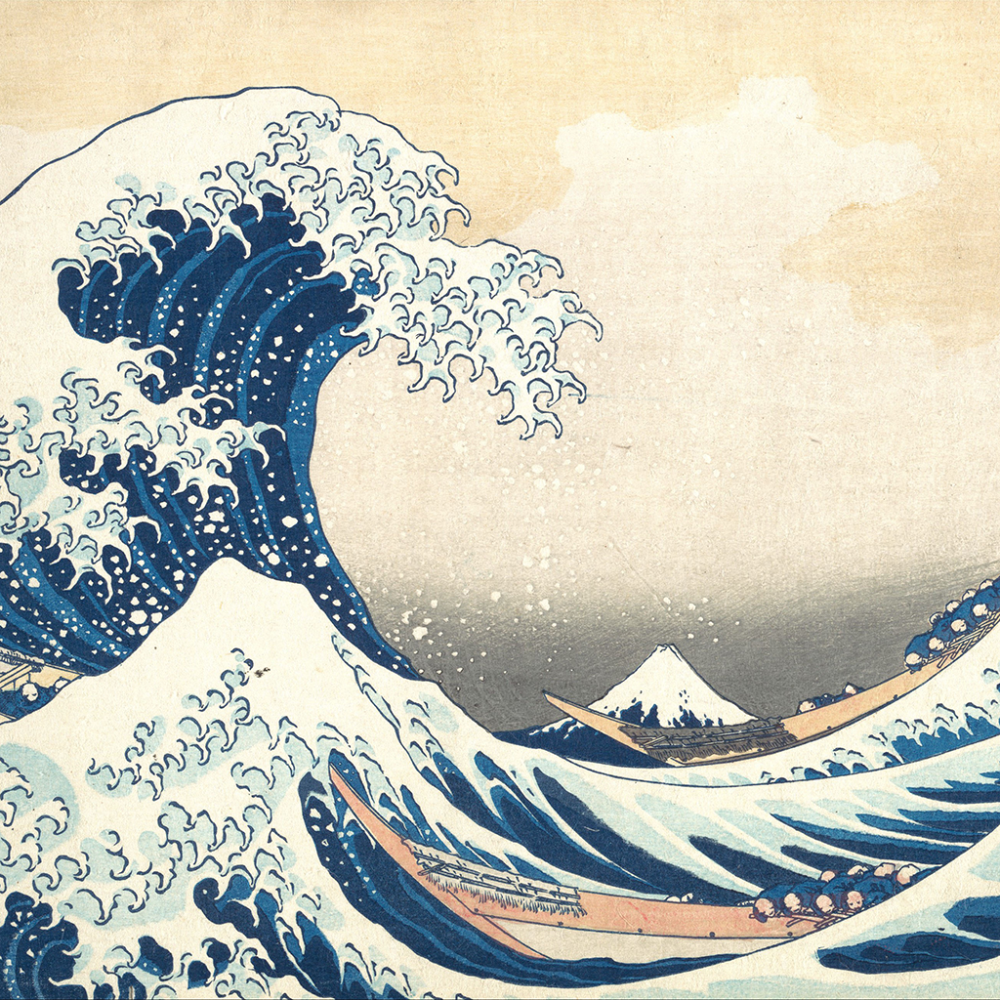

In [39]:
Image(data=wave_image, width=256)

In [40]:
wave_image_mask = open("./images/great_wave_mask.png", "rb").read()

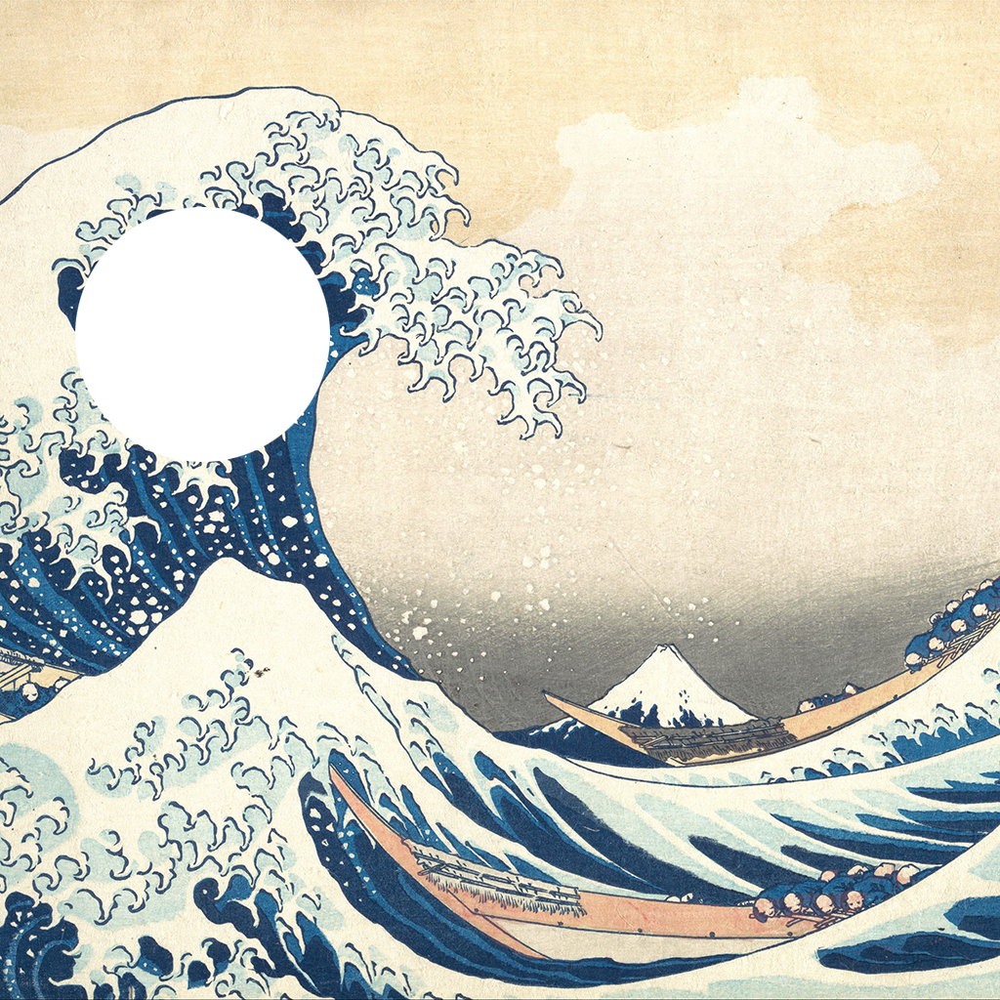

In [41]:
Image(data=wave_image_mask, width=256)

In [43]:
response = openai.Image.create_edit(
    image=wave_image,
    mask=wave_image_mask,
    prompt="a surfer riding a surfboard on the great wave",
    n=1,
    size="1024x1024"
)

APIError: The server had an error while processing your request. Sorry about that! You can retry your request, or contact us through our help center at help.openai.com if the error persists. (Please include the request ID 48eb77fb8aedcb4d717691531f0a7fe0 in your message.) {
  "error": {
    "code": null,
    "message": "The server had an error while processing your request. Sorry about that! You can retry your request, or contact us through our help center at help.openai.com if the error persists. (Please include the request ID 48eb77fb8aedcb4d717691531f0a7fe0 in your message.)",
    "param": null,
    "type": "server_error"
  }
}
 500 {'error': {'code': None, 'message': 'The server had an error while processing your request. Sorry about that! You can retry your request, or contact us through our help center at help.openai.com if the error persists. (Please include the request ID 48eb77fb8aedcb4d717691531f0a7fe0 in your message.)', 'param': None, 'type': 'server_error'}} {'Date': 'Tue, 23 May 2023 13:05:14 GMT', 'Content-Type': 'application/json', 'Content-Length': '366', 'Connection': 'keep-alive', 'access-control-allow-origin': '*', 'openai-version': '2020-10-01', 'x-request-id': '48eb77fb8aedcb4d717691531f0a7fe0', 'openai-processing-ms': '94', 'strict-transport-security': 'max-age=15724800; includeSubDomains', 'CF-Cache-Status': 'DYNAMIC', 'Server': 'cloudflare', 'CF-RAY': '7cbd82499c41394a-IAD', 'alt-svc': 'h3=":443"; ma=86400, h3-29=":443"; ma=86400'}

In [ ]:
response["dat